# MRI Reconstruction
## Beenita Shah

In [18]:
#Import statements
import warnings
warnings.filterwarnings('ignore')
import h5py, os
from functions import transforms as T
from functions.subsample import MaskFunc
from scipy.io import loadmat
from torch.utils.data import DataLoader
import numpy as np
import torch
from matplotlib import pyplot as plt, animation as animation, style
from torch.nn import functional as F
import time
from torchsummary import summary
import pandas as pd
import gc
from skimage.measure import compare_ssim 

In [19]:
#This method allows visulization of n slices, slice_nums, from a given volume, data.
def show_slices(data, slice_nums, cmap=None):
    fig = plt.figure(figsize=(15,10))
    for i, num in enumerate(slice_nums):
        plt.subplot(1, len(slice_nums), i + 1)
        plt.imshow(data[num], cmap=cmap)
        plt.axis('off')

In [20]:
class MRIDataset(DataLoader):
    def __init__(self, data_list, acceleration, center_fraction, use_seed, is_undersampled):
        self.data_list = data_list
        self.acceleration = acceleration
        self.center_fraction = center_fraction
        self.use_seed = use_seed
        self.is_undersampled = is_undersampled

    def __len__(self):
        return len(self.data_list)

    def __getitem__(self, idx):
        subject_id = self.data_list[idx]
        return get_epoch_batch(subject_id, self.acceleration, self.center_fraction, self.is_undersampled, self.use_seed)

In [21]:
def get_epoch_batch(subject_id, acc, center_fract, is_undersampled, use_seed=True):

    fname, rawdata_name, slice = subject_id  
    
    #If loading test data select using kspace_8af or kspace_4af keys. If loading data use kspace key
    with h5py.File(rawdata_name, 'r') as data:
        if(is_undersampled):
            rawdata = data['kspace_4af'][slice]
        else:
            rawdata = data['kspace'][slice]
                      
    slice_kspace = T.to_tensor(rawdata).unsqueeze(0)
    S, Ny, Nx, ps = slice_kspace.shape

    #apply random mask
    shape = np.array(slice_kspace.shape)
    mask_func = MaskFunc(center_fractions=[center_fract], accelerations=[acc])
    seed = None if not use_seed else tuple(map(ord, fname))
    mask = mask_func(shape, seed)
      
    #undersample
    masked_kspace = torch.where(mask == 0, torch.Tensor([0]), slice_kspace)
    masks = mask.repeat(S, Ny, 1, ps)

    #apply inverse fourier transform
    img_gt, img_und = T.ifft2(slice_kspace), T.ifft2(masked_kspace)

    # perform data normalization which is important for network to learn useful features
    # during inference there is no ground truth image so use the zero-filled recon to normalize
    norm = T.complex_abs(img_und).max()
    if norm < 1e-6: norm = 1e-6
    
    # normalized data
    img_gt, img_und, rawdata_und = img_gt/norm, img_und/norm, masked_kspace/norm
        
    return img_gt.squeeze(0), img_und.squeeze(0), rawdata_und.squeeze(0), masks.squeeze(0), norm

In [22]:
#Go through each subset (training, validation) and list all
#the file names, the file paths and the slices for subjects in the training and validation sets
def load_data_path(data_path):
    
    data_list = {}
    #Leave list as sorted so the train,val and test sets will remain the same - i.e there won't be an overlab 
    #between them
    all_files = sorted(os.listdir(data_path))
    #Using 80% of data of total training - remaining 20% will be used for test
    all_files = all_files[:round(len(all_files)*0.8)]
    #Splitting up training set further into training and validation sets.
    #Using 70% of training data for training and 30% for validation
    train, val = all_files[:round(len(all_files)*0.7)] ,all_files[round(len(all_files)*0.7):]
    data_list['train'] = []
    data_list['val'] = []
    
    for index, fname in enumerate(train):
        data_set = 'train'
        which_data_path = data_path
        subject_data_path = os.path.join(which_data_path, fname) 
        
        if not os.path.isfile(subject_data_path): continue
        
        with h5py.File(subject_data_path, 'r') as data:
            num_slice = data['kspace'].shape[0]
            # the first 5 slices are mostly noise so it is better to exlude them
            data_list[data_set] += [(fname, subject_data_path, slice) for slice in range(5, num_slice)]
            
    for index, fname in enumerate(val):
        data_set = 'val'
        which_data_path = data_path
        subject_data_path = os.path.join(which_data_path, fname)
        
        if not os.path.isfile(subject_data_path): continue
            
        with h5py.File(subject_data_path, 'r') as data:
            num_slice = data['kspace'].shape[0]
            # the first 5 slices are mostly noise so it is better to exlude them
            data_list[data_set] += [(fname, subject_data_path, slice) for slice in range(5, num_slice)]
            
    return data_list  

In [23]:
#Data loading method used at test time - on the test set (20% of the original training set)
#Loads all slices from a single volume as a 'dataset' so can calculate averages over whole volume per image
def load_test_data_path(test_path, file_name):
    data_list['test'] = [] 
    file_path = test_path + file_name
    
    if os.path.isfile(file_path):
        with h5py.File(file_path, 'r') as data:
            num_slice = data['kspace'].shape[0]
            # the first 5 slices are mostly noise so it is better to exlude them
            #print('Number of Slices: ' + str(num_slice))
            data_list['test'] += [(file_name, file_path, slice) for slice in range(5, num_slice)]
            
    return data_list  

In [24]:
#Data loading method used at test time - generating output from actual test directory
#Loads all slices from a single volume as a 'dataset' so can calculate averages over whole volume per image
#type_undersample should be kspace_8af or kspace_4af
def load_undersampled_data_path(test_path, file_name, type_undersamp):
    data_list['test'] = [] 
    file_path = test_path + file_name
    
    if os.path.isfile(file_path):
        with h5py.File(file_path, 'r') as data:
            num_slice = data[type_undersamp].shape[0]
            # the first 5 slices are mostly noise so it is better to exlude them
            data_list['test'] += [(file_name, file_path, slice) for slice in range(5, num_slice)]
            
    return data_list  

In [25]:
#Calculates SSIM between two volumes
def ssim(gt, pred):
    """ Compute Structural Similarity Index Metric (SSIM). """
    return compare_ssim(
        gt.transpose(1, 2, 0), pred.transpose(1, 2, 0), multichannel=True, data_range=gt.max()
    )

In [26]:
#Method called once per epoch during training
def train_epoch(model, optimizer, train_loader):
    #setting model to training mode
    model.train()
    avg_loss = 0.
    #To allow time to be logged
    start_epoch = start_iter = time.perf_counter()
    for iteration, sample in enumerate(train_loader):
        
        img_gt, img_und, rawdata_und, masks, norm = sample
         
        # Extract input and ground truth image
        input_img = T.complex_abs(img_und).squeeze()
        input_img = T.center_crop(input_img, [320, 320])
        input_img = input_img[None,None,:,:].cuda()
        target_img = T.complex_abs(img_gt).squeeze()
        target_img = T.center_crop(target_img, [320, 320])
        target_img = target_img[None,None,:,:].cuda()
        
        #call model over image
        output = model(input_img)
        #calculate loss using output image and target image
        loss = F.l1_loss(output, target_img)
        #calling zero_grad sets all gradients to zero
        optimizer.zero_grad()
        #Gradient of loss w.r.t all parameters calculated
        loss.backward()
        #Optimizer iterates over all parameters and updates them according to new gradient. 
        optimizer.step()
        
        #average loss
        avg_loss = 0.99 * avg_loss + 0.01 * loss.item() if iteration > 0 else loss.item()
    
    return avg_loss, time.perf_counter() - start_epoch
    

In [27]:
#Method called once per epoch during training, after train_epoch has been called.
#Evaluates how well model is performing
def val_epoch(model, test_loader):
    #Setting model to evaluation mode
    model.eval()
    start_epoch = start_iter = time.perf_counter()
    losses = []
    
    for iteration, sample in enumerate(test_loader):
        img_gt, img_und, rawdata_und, masks, norm = sample
         
        # Extract input and ground truth image
        input_img = T.complex_abs(img_und).squeeze()
        input_img = T.center_crop(input_img, [320, 320])
        input_img = input_img[None,None,:,:].cuda()
        target_img = T.complex_abs(img_gt).squeeze()
        target_img = T.center_crop(target_img, [320, 320])
        target_img = target_img[None,None,:,:].cuda()
        
        output = model(input_img)
        loss = F.l1_loss(output, target_img)
        losses.append(loss.item())

    return np.mean(losses), time.perf_counter() - start_epoch

In [28]:
#Called when evaluating test set.
#Called once for every FILE
def test_epoch(model, test_loader):
    model.eval()
    start_epoch = start_iter = time.perf_counter()
    losses = []
    #Stores all output slices
    output_vol = []
    gt_vol = []
    
    for iteration, sample in enumerate(test_loader):
        img_gt, img_und, rawdata_und, masks, norm = sample
         
        # Extract input and ground truth image
        input_img = T.complex_abs(img_und).squeeze()
        input_img = T.center_crop(input_img, [320, 320])
        input_img = input_img[None,None,:,:].cuda()
        
        output = model(input_img)
        output = output[0,0,:,:].cpu().detach()
        #Multiply output by normalization factor so it matches original, non-normalized ground truth
        #Add output to list
        output_vol.append(output*norm)
        
    return output_vol, time.perf_counter() - start_epoch

In [29]:
#Matplotlib update method
#Allows real-time visulization of training and test loss
def mpl_update():
    line1.set_ydata(np.asarray(train_loss_ys))
    line2.set_ydata(np.asarray(val_loss_ys))
    line1.set_xdata(np.asarray(epoch_list))
    line2.set_xdata(np.asarray(epoch_list))
    ax.set_xlim(0, max(epoch_list))
    ax.set_ylim(0, max([max(train_loss_ys),max(val_loss_ys)]))
    fig.canvas.draw()
    fig.canvas.flush_events()

In [30]:
#U-Net class. Existing Facebook implementation
"""
Copyright (c) Facebook, Inc. and its affiliates.
This source code is licensed under the MIT license found in the
LICENSE file in the root directory of this source tree.
"""

import torch
from torch import nn
from torch.nn import functional as F


class ConvBlock(nn.Module):
    """
    A Convolutional Block that consists of two convolution layers each followed by
    instance normalization, relu activation and dropout.
    """

    def __init__(self, in_chans, out_chans, drop_prob):
        """
        Args:
            in_chans (int): Number of channels in the input.
            out_chans (int): Number of channels in the output.
            drop_prob (float): Dropout probability.
        """
        super().__init__()

        self.in_chans = in_chans
        self.out_chans = out_chans
        self.drop_prob = drop_prob

        self.layers = nn.Sequential(
            nn.Conv2d(in_chans, out_chans, kernel_size=3, padding=1),
            nn.InstanceNorm2d(out_chans),
            nn.ReLU(),
            nn.Dropout2d(drop_prob),
            nn.Conv2d(out_chans, out_chans, kernel_size=3, padding=1),
            nn.InstanceNorm2d(out_chans),
            nn.ReLU(),
            nn.Dropout2d(drop_prob)
        )

    def forward(self, input):
        """
        Args:
            input (torch.Tensor): Input tensor of shape [batch_size, self.in_chans, height, width]
        Returns:
            (torch.Tensor): Output tensor of shape [batch_size, self.out_chans, height, width]
        """
        return self.layers(input)

    def __repr__(self):
        return f'ConvBlock(in_chans={self.in_chans}, out_chans={self.out_chans}, ' \
            f'drop_prob={self.drop_prob})'


class UnetModel(nn.Module):
    """
    PyTorch implementation of a U-Net model.
    This is based on:
        Olaf Ronneberger, Philipp Fischer, and Thomas Brox. U-net: Convolutional networks
        for biomedical image segmentation. In International Conference on Medical image
        computing and computer-assisted intervention, pages 234–241. Springer, 2015.
    """

    def __init__(self, in_chans, out_chans, chans, num_pool_layers, drop_prob):
        """
        Args:
            in_chans (int): Number of channels in the input to the U-Net model.
            out_chans (int): Number of channels in the output to the U-Net model.
            chans (int): Number of output channels of the first convolution layer.
            num_pool_layers (int): Number of down-sampling and up-sampling layers.
            drop_prob (float): Dropout probability.
        """
        super().__init__()

        self.in_chans = in_chans
        self.out_chans = out_chans
        self.chans = chans
        self.num_pool_layers = num_pool_layers
        self.drop_prob = drop_prob

        self.down_sample_layers = nn.ModuleList([ConvBlock(in_chans, chans, drop_prob)])
        ch = chans
        for i in range(num_pool_layers - 1):
            self.down_sample_layers += [ConvBlock(ch, ch * 2, drop_prob)]
            ch *= 2
        self.conv = ConvBlock(ch, ch, drop_prob)

        self.up_sample_layers = nn.ModuleList()
        for i in range(num_pool_layers - 1):
            self.up_sample_layers += [ConvBlock(ch * 2, ch // 2, drop_prob)]
            ch //= 2
        self.up_sample_layers += [ConvBlock(ch * 2, ch, drop_prob)]
        self.conv2 = nn.Sequential(
            nn.Conv2d(ch, ch // 2, kernel_size=1),
            nn.Conv2d(ch // 2, out_chans, kernel_size=1),
            nn.Conv2d(out_chans, out_chans, kernel_size=1),
        )

    def forward(self, input):
        """
        Args:
            input (torch.Tensor): Input tensor of shape [batch_size, self.in_chans, height, width]
        Returns:
            (torch.Tensor): Output tensor of shape [batch_size, self.out_chans, height, width]
        """
        stack = []
        output = input
        # Apply down-sampling layers
        for layer in self.down_sample_layers:
            output = layer(output)
            stack.append(output)
            output = F.max_pool2d(output, kernel_size=2)

        output = self.conv(output)

        # Apply up-sampling layers
        for layer in self.up_sample_layers:
            output = F.interpolate(output, scale_factor=2, mode='bilinear', align_corners=False)
            output = torch.cat([output, stack.pop()], dim=1)
            output = layer(output)
        return self.conv2(output)

In [ ]:
#Final Model training loop
if __name__ == '__main__':
    
    #Change file path accordingly
    data_path = '/data/local/NC2019MRI/train'
    data_list = load_data_path(data_path) # first load all file names, paths and slices.

    #acc and cent_fract should be (8, 0.04) or (4, 0.08)
    acc = 4
    cen_fract = 0.08
    # random masks for each slice 
    seed = False
    # data loading is faster using a bigger number for num_workers. 0 means using one cpu to load data
    num_workers = 12 
    
    # create data loader for training and validation sets
    train_dataset = MRIDataset(data_list['train'], acceleration=acc, center_fraction=cen_fract, use_seed=seed, is_undersampled=False)
    train_loader = DataLoader(train_dataset, shuffle=True, batch_size=1, num_workers=num_workers)
    
    val_dataset = MRIDataset(data_list['val'], acceleration=acc, center_fraction=cen_fract, use_seed=seed, is_undersampled=False)
    val_loader = DataLoader(val_dataset, shuffle=True, batch_size=1, num_workers=num_workers)
       
### Uncomment for live graph of test and validation loss
    #Metrics
    epoch_list = []
    train_loss_ys = []
    val_loss_ys = []
    #needed to allow graph to appear in a seperate window
    %matplotlib qt
    #MPL
#     plt.ion()
#     fig = plt.figure()
#     ax = fig.add_subplot(111)
#     line1, = ax.plot(np.asarray(epoch_list), np.asarray(train_loss_ys), label='Training loss')
#     line2, = ax.plot(np.asarray(epoch_list), np.asarray(val_loss_ys), label='Val loss') 
#     ax.set_title('Training and Validation Loss')
#     ax.set_xlabel('Epoch')
#     ax.set_ylabel('L1 Loss')
#     ax.legend()
    
    #Create model and send to GPU
    model = UnetModel(in_chans=1, out_chans=1, chans=32, num_pool_layers=4, drop_prob = 0.05)
    model.cuda()
    #Uncomment to see summary of model. Make sure torchsummary package is installed
    summary(model, (1,320,320))
    optimizer = torch.optim.RMSprop(model.parameters(), lr=0.0003)
    for e in range(50):
        train_loss, train_time = train_epoch(model, optimizer, train_loader)
        val_loss, val_time = val_epoch(model, val_loader)
        #uncomment if using live graph
        #Metrics update
        epoch_list.append(e)        
        train_loss_ys.append(train_loss)
        val_loss_ys.append(val_loss)
        #Matplotlib update
        #mpl_update()
        print('Epoch: ' + str(e) + ' | Train Loss: ' + str(train_loss) + ' | Val Loss: ' + str(val_loss))

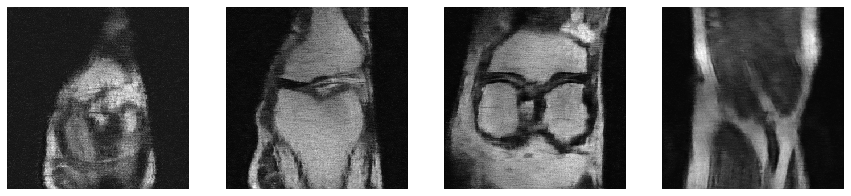

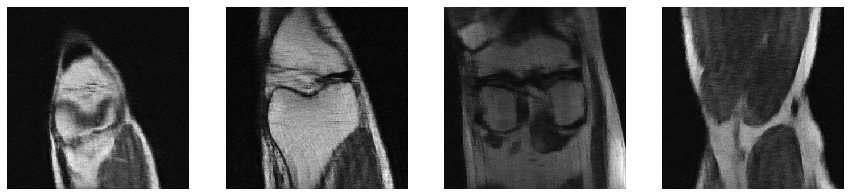

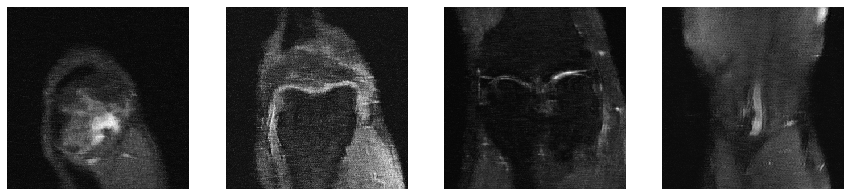

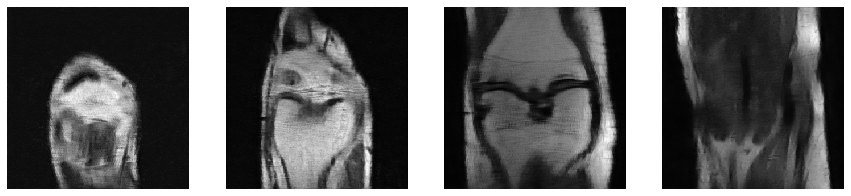

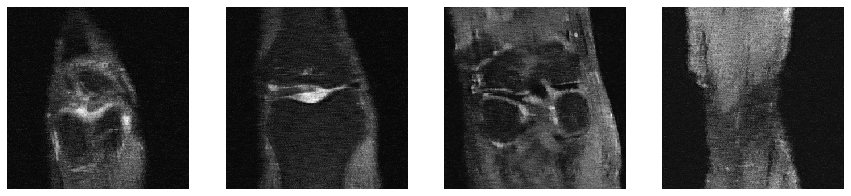

...

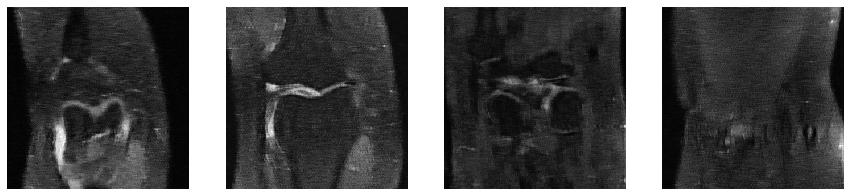

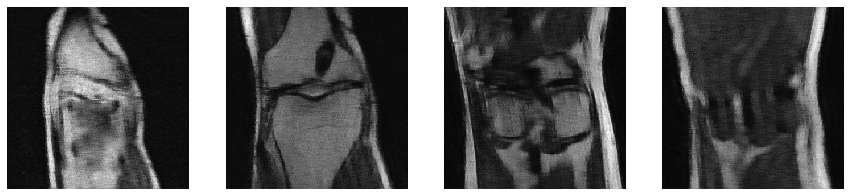

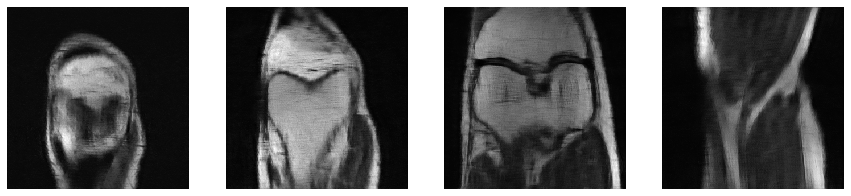

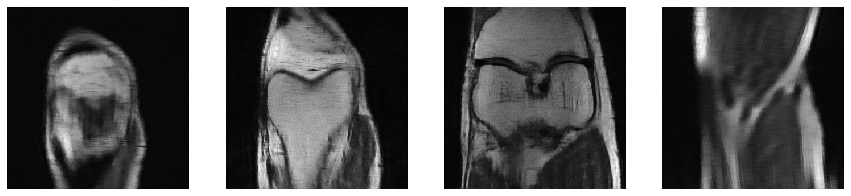

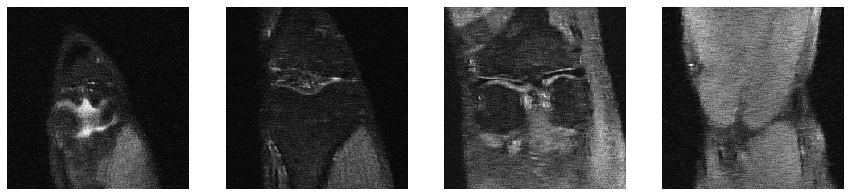

In [34]:
#Testing the trained model on test set - 20%
data_path = '/data/local/NC2019MRI/train/'
all_files = sorted(os.listdir(data_path))
#Using 20% of data as test set
all_files = all_files[round(len(all_files)*0.8):]

#acc and cent_fract should be (8, 0.04) or (4, 0.08)
acc = 4
cen_fract = 0.08
# random masks for each slice 
seed = False
# data loading is faster using a bigger number for num_workers. 0 means using one cpu to load data
num_workers = 12 

all_losses = []
#Makes sure slices are shown within the notebook
%matplotlib inline

for file in all_files:
    # first load all file names, paths and slices.
    data_list = load_test_data_path(data_path, file)
    #Create a dataloader containing all slices for particular slice
    test_dataset = MRIDataset(data_list['test'], acceleration=acc, center_fraction=cen_fract, use_seed=seed,is_undersampled=False)
    test_loader = DataLoader(test_dataset, shuffle=False, batch_size=1, num_workers=num_workers)
    #Call model over all slices. pred_vol is a list of volume slices (in correct order)
    pred_vol,test_time = test_epoch(model, test_loader)
    
    #3d Volume achieved by stacking slices
    pred = torch.stack(pred_vol, dim=0)
    
    #Loading Ground Truth
    with h5py.File(data_path + file,  "r") as hf:
        volume_kspace = hf['kspace'][()]
        
    #Transform k-space to real valued image
    volume_kspace2 = T.to_tensor(volume_kspace)
    # Apply Inverse Fourier Transform to get the complex image
    volume_image = T.ifft2(volume_kspace2)            
    volume_image_abs = T.complex_abs(volume_image)
    volume_image_abs = volume_image_abs[5:, :, :]
    real_gt = T.center_crop(volume_image_abs, [320, 320])
    
    #visualize predicted and gt slices
    show_slices(pred, [5, 10, 20, pred.shape[0]-1], cmap='gray')
    #show_slices(real_gt, [5, 10, 20, pred.shape[0]-1], cmap='gray')
    
    #calculate ssim score between volumes
    ssim_score = ssim(real_gt.numpy(), pred.numpy())
    all_losses.append(ssim_score)

In [35]:
#Calculating Average SSIM
average_ssim = sum(all_losses) / len(all_losses)
print('Average SSIM: '+ str(average_ssim))

Average SSIM: 0.683455247283292


In [36]:
#Called when evaluating test set.
#Called once for every FILE
def actual_test_epoch(model, test_loader):
    model.eval()
    start_epoch = start_iter = time.perf_counter()
    losses = []
    #Stores all output slices
    output_vol = []
    gt_vol = []
    
    for iteration, sample in enumerate(test_loader):
        img_gt, img_und, rawdata_und, masks, norm = sample
         
        # Extract input and ground truth image
        input_img = T.complex_abs(img_gt).squeeze()
        input_img = T.center_crop(input_img, [320, 320])
        input_img = input_img[None,None,:,:].cuda()
        
        output = model(input_img)
        output = output[0,0,:,:].cpu().detach()
        #Multiply output by normalization factor so it matches original, non-normalized ground truth
        #Add output to list
        output_vol.append(output*norm)
        
    return output_vol, time.perf_counter() - start_epoch

In [37]:
#Method to save reconstructions.
#Change so can save with 'keys'
def save_reconstructions(reconstructions, out_dir, recon_val):
    """
    Saves the reconstructions from a model into h5 files that is appropriate for submission
    to the leaderboard.
    Args:
        reconstructions (dict[str, np.array]): A dictionary mapping input filenames to
            corresponding reconstructions (of shape num_slices x height x width).
        out_dir (pathlib.Path): Path to the output directory where the reconstructions
            should be saved.
    """
    if not(os.path.isdir(out_dir)):
        os.mkdir(out_dir)
    
    for fname, recons in reconstructions.items():
        subject_path = os.path.join(out_dir, fname)
        print(subject_path)
        
        if(os.path.isfile(subject_path)):
            with h5py.File(subject_path, 'a') as f:
                f.create_dataset(recon_val, data=recons)
        else:
            with h5py.File(subject_path, 'w') as f:
                f.create_dataset(recon_val, data=recons)

In [ ]:
#Running actual test data through model and saving output
data_path = '/data/local/NC2019MRI/test/'
all_files = sorted(os.listdir(data_path))

acc = 4
cen_fract = 0.08
seed = False # random masks for each slice 
num_workers = 12 # data loading is faster using a bigger number for num_workers. 0 means using one cpu to load data

for file in all_files:
    print(file)
    data_list = load_undersampled_data_path(data_path, file, 'kspace_4af')# first load all file names, paths and slices.
    test_dataset = MRIDataset(data_list['test'], acceleration=acc, center_fraction=cen_fract, use_seed=seed, is_undersampled=True)
    test_loader = DataLoader(test_dataset, shuffle=False, batch_size=1, num_workers=num_workers)
    pred_vol,test_time = actual_test_epoch(model, test_loader)
    
    #3d Volume achieved
    pred = torch.stack(pred_vol, dim=0)
    recon = {file: pred}
    #Change
    out_dir = '/run/media/bhm699/LIAM USB/mri_recons'
    #keys the recon can be saved againts
    recon_vals = ['recon_4af', 'recon_8af']
    #select correct recon val
    save_reconstructions(recon, out_dir, recon_vals[0])
    
    
    show_slices(pred, [5, 10, 20, pred.shape[0]-1], cmap='gray')

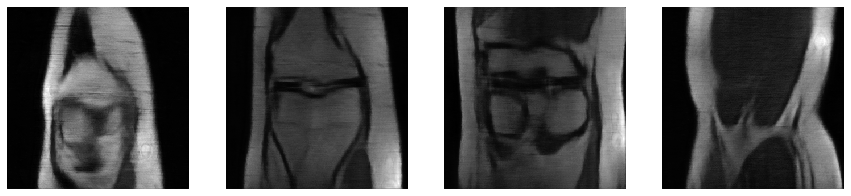

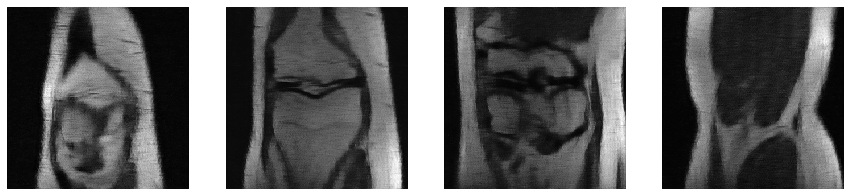

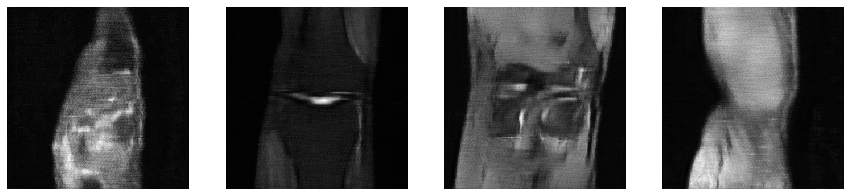

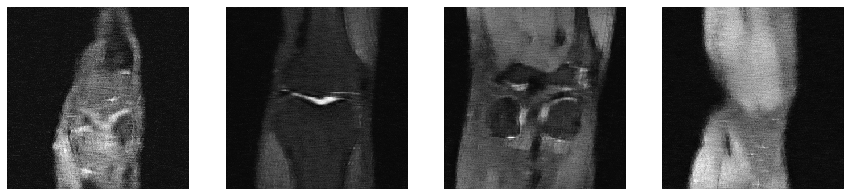

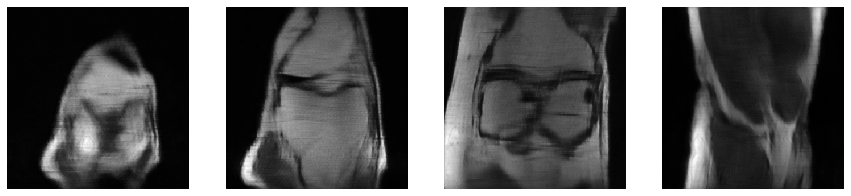

...

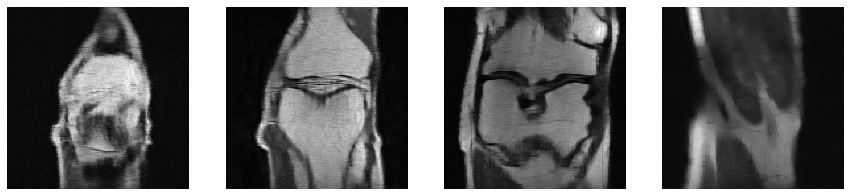

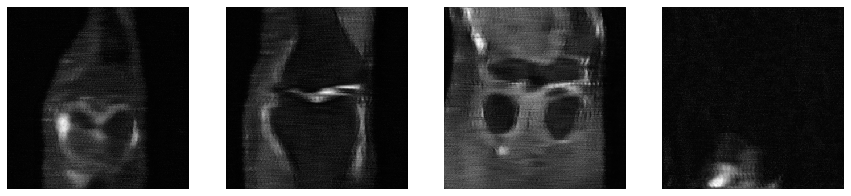

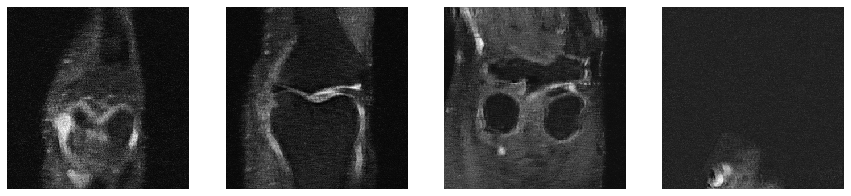

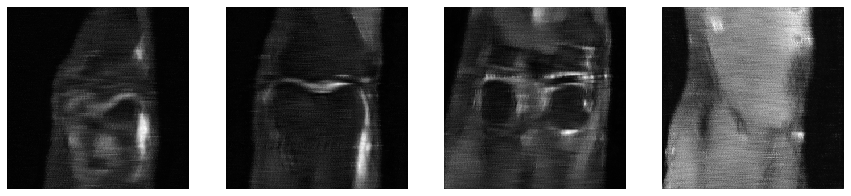

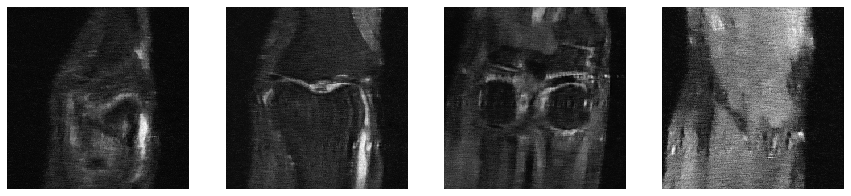

In [40]:
#Testing is reconstructions saved correctly
data_path = '/run/media/bhm699/LIAM USB/mri_recons/'
all_files = sorted(os.listdir(data_path))

for file in all_files:
    
    with h5py.File(data_path+file,  "r") as hf:
        volume_kspace_two = hf['recon_4af'][()]
        volume_kspace = hf['recon_8af'][()]

    show_slices(volume_kspace, [5, 10, 20, volume_kspace.shape[0]-1], cmap='gray')
    show_slices(volume_kspace_two, [5, 10, 20, volume_kspace_two.shape[0]-1], cmap='gray')


In [0]:
#Final experimentation loop. DO NOT RUN AS IS. 
#Comment/uncomment required parts

if __name__ == '__main__':
    
    data_path_train = '/data/local/NC2019MRI/train'
    data_path_val = '/data/local/NC2019MRI/train'
    data_list = load_data_path(data_path_train, data_path_val) # first load all file names, paths and slices.

    acc = 8
    cen_fract = 0.04
    seed = False # random masks for each slice 
    num_workers = 12 # data loading is faster using a bigger number for num_workers. 0 means using one cpu to load data
    
    # create data loader for training set. It applies same to validation set as well
    train_dataset = MRIDataset(data_list['train'], acceleration=acc, center_fraction=cen_fract, use_seed=seed,is_undersampled=False)
    train_loader = DataLoader(train_dataset, shuffle=True, batch_size=1, num_workers=num_workers)
    
    val_dataset = MRIDataset(data_list['val'], acceleration=acc, center_fraction=cen_fract, use_seed=seed,is_undersampled=False)
    val_loader = DataLoader(val_dataset, shuffle=True, batch_size=1, num_workers=num_workers)
    
    #create a dataframe to store exprimentation results
    parameter_training_info = pd.DataFrame(columns=['LR', 'Channels', 'Pools', 'TrainingLoss', 'TrainingTime', 'ValidationLoss', 'ValidationTime'])
    #Change name of file to match what is being testes
    file_name = 'rsmprop_smaller_lr.csv'
    parameter_training_info.to_csv(file_name)
    
#At any one time one of the three for loops implemented before were in action. Initally a triple nested for loop was
#implemented as this would test all combinations of all parameters being experimented with but this proved to be too
#time consuming and inefficient hence parameters were trained iteratively

#Loss function was tested manually
#Epochs and dropout tested once these hyperparameters had been decided

    #First Optimizers and a range of learning rates for each optimizer were tested
    lr = [0.0001, 0.0003, 0.001, 0.003, 0.01, 0.03]
    for rate in lr:
        print('Learning rate: ', rate)
        model = UnetModel(in_chans=1, out_chans=1, chans=16, num_pool_layers=4, drop_prob = 0.05)
        model.cuda()
        #Change name to optimiser being tested
        optimizer = torch.optim.RMSprop(model.parameters(), rate)
        for e in range(35):
            print('Epoch: ' + str(e))
            train_loss, train_time = train_epoch(model, optimizer, train_loader)
            val_loss, val_time = val_epoch(model, val_loader)
            
            train_loss_ys.append(train_loss)
            training_time.append(train_time)
            val_loss_ys.append(val_loss)
            validation_time.append(val_time)   
        print('Writing to file')
        with open(file_name,'a') as f:
            #fd.write(new_row)
            writer=csv.writer(f)
            #Change values here to match what is being tested
            writer.writerow([str(rate),str(16), str(4), [train_loss_ys], [training_time], [val_loss_ys], [validation_time]])
        #Ensures memory doesn't fill up 
        gc.collect()

    #Loop testing size of feature map resulting from first convolution layer    
    chans = [32,64,128, 256]
    for chan in chans:
        print('Channel ', chan)
        model = UnetModel(in_chans=1, out_chans=1, chans=chan, num_pool_layers=4, drop_prob = 0.05)
        model.cuda()
        #Change name to optimiser we decide on!!! and change learning rate!
        optimizer = torch.optim.RMSprop(model.parameters(), 0.01)
        for e in range(35):
            print('Epoch: ' + str(e))
            train_loss, train_time = train_epoch(model, optimizer, train_loader)
            val_loss, val_time = val_epoch(model, val_loader)
            
            train_loss_ys.append(train_loss)
            training_time.append(train_time)
            val_loss_ys.append(val_loss)
            validation_time.append(val_time)   
        print('Writing to file')
        with open(file_name,'a') as f:
            #fd.write(new_row)
            writer=csv.writer(f)
            #Change values here to match what is being tested
            writer.writerow([str(0.01),str(chan), str(4), [train_loss_ys], [training_time], [val_loss_ys], [validation_time]])
        #Ensures memory doesn't fill up 
        gc.collect()
    
    #Loop testing number of contraction and extraction blocks in respective paths
    pools = [3,4,5]
    for p in pools:
        print('Num_pools ', p)
        model = UnetModel(in_chans=1, out_chans=1, chans=16, num_pool_layers=p, drop_prob = 0.05)
        model.cuda()
        #Change name to optimiser being tested
        optimizer = torch.optim.RMSprop(model.parameters(), rate)
        for e in range(35):
            print('Epoch: ' + str(e))
            train_loss, train_time = train_epoch(model, optimizer, train_loader)
            val_loss, val_time = val_epoch(model, val_loader)
            
            train_loss_ys.append(train_loss)
            training_time.append(train_time)
            val_loss_ys.append(val_loss)
            validation_time.append(val_time)   
            
        print('Writing to file')
        with open(file_name,'a') as f:
            #fd.write(new_row)
            writer=csv.writer(f)
            #Change values here to match what is being tested
            writer.writerow([str(0.01),str(16), str(p), [train_loss_ys], [training_time], [val_loss_ys], [validation_time]])
        #Ensures memory doesn't fill up 
        gc.collect()